In [1]:
from gbdxtools import CatalogImage, Interface
import os, sys
import numpy as np
import geopandas as gpd
from matplotlib import pyplot as plt
from scipy.misc import bytescale
import shapely
from shapely.wkt import loads
import pandas as pd

%matplotlib inline

In [2]:
image_ids = ['17669959_3',      # RE 8-29-2014, alt.id 2014-08-29T223031_RE1 (SW corner)
             '17559220_1',      # RE 8-23-2014, alt.id 2014-08-23T222157_RE5 (SW corner)
             '17511071_3',      # RE 8-14-2014, alt.id 2014-08-14T223214_RE5 (SW corner)
             '10504100112AB900' # GE 08-11-2014 (NE corner) 
            ] 

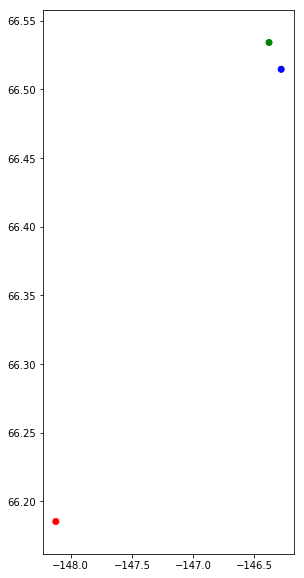

In [3]:
pts_shp = 'sample_pts/sample_pts.shp'
pts = gpd.read_file(pts_shp)

fig, ax = plt.subplots(1, figsize=(4.5,10))
pts.plot(ax=ax,  color=['Red', 'Green', 'Blue'], alpha=1, legend=True)
# ax.legend(loc='middle')

In [4]:
# points 1,2 of 0,1,2 should intersect the GeoEeye scene
ge_scene_ps = CatalogImage(image_ids[-1], acomp=True, pansharpen=True)
ge_scene_ms = CatalogImage(image_ids[-1], acomp=True)

In [5]:
bbox = pts['geometry'][2].buffer(0.003).bounds
ge_ps_aoi = ge_scene_ps.aoi(bbox=bbox)
ge_ms_aoi = ge_scene_ms.aoi(bbox=bbox)

In [6]:
ge_ps_aoi.shape, ge_ms_aoi.shape


((4, 1333, 1333), (4, 333, 333))

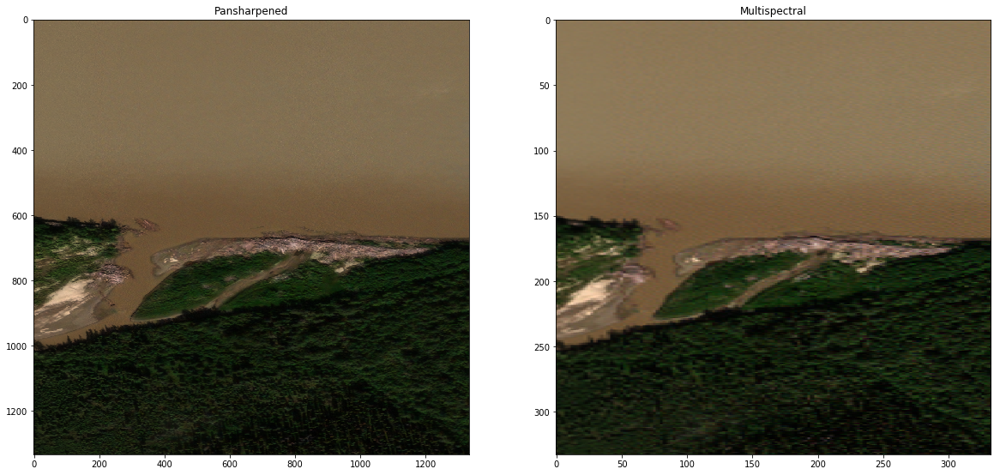

In [7]:
# %matplotlib qt
fig, ax = plt.subplots(1,2, figsize = (20,10))
titles = ('Pansharpened', 'Multispectral')
for i, data in enumerate([ge_ps_aoi, ge_ms_aoi]):
    ax[i].imshow(bytescale(np.rollaxis(data[[2,1,0], :, :], 0, 3)))
    ax[i].set_title(titles[i])
    #data.plot()
    
plt.show()

## take a look at clustering to see if the wood piles pop out

In [8]:
from sklearn.cluster import KMeans
from scipy.ndimage import generic_filter

nclass = 8
clf_pl = KMeans(n_clusters=nclass, random_state=10)

# fit it on the first image
im_arr = np.rollaxis(ge_ps_aoi, 0, 3)
X_ps = im_arr.reshape(-1,4)

# add in a sliding window calculation for texture
radius = 5
generic_filter(im_arr[:,:,1], np.std, size=2*radius)
                                      
# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))

# fit the KMeans classifier
predictedClass_ps = clf_pl.fit_predict(X_ps, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_ps += 1

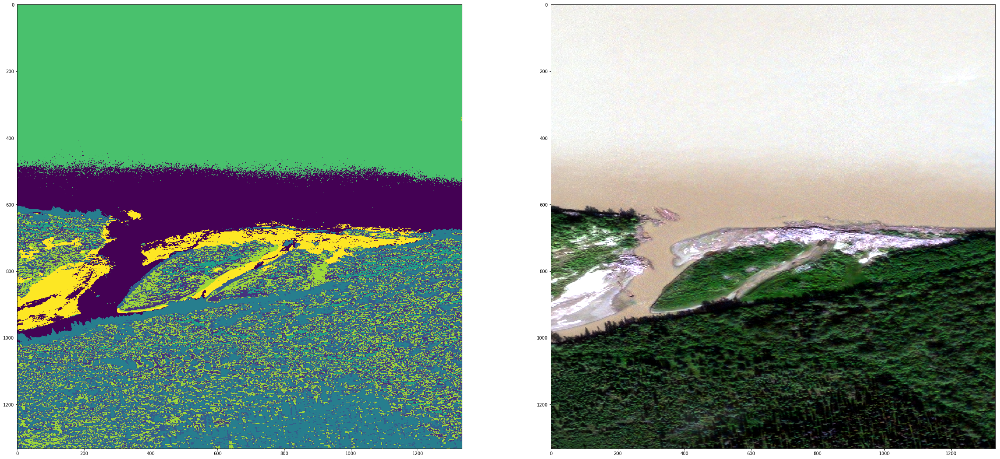

In [9]:
## show the result
fig, ax = plt.subplots(1,2, figsize = (40,40))
pred_data_ps = predictedClass_ps.reshape(im_arr.shape[:2])
ax[0].imshow(pred_data_ps)
ax[1].imshow(bytescale(ge_ps_aoi.rgb()))
plt.show()

In [10]:
from sklearn.cluster import KMeans
from scipy.ndimage import generic_filter

# nclass = 7
clf_ms = KMeans(n_clusters=nclass, random_state=10)

# fit it on the first image
im_arr_ms = np.rollaxis(ge_ms_aoi, 0, 3)
X_ms = im_arr_ms.reshape(-1,4)

# add in a sliding window calculation for texture
# radius = 5
# generic_filter(im_arr_ms[:,:,1], np.std, size=2*radius)
                                      
# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))

# fit the KMeans classifier
predictedClass_ms = clf_ms.fit_predict(X_ms, y=None)
# predictedClass_ms = clf_pl.predict(X_ms)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_ms += 1

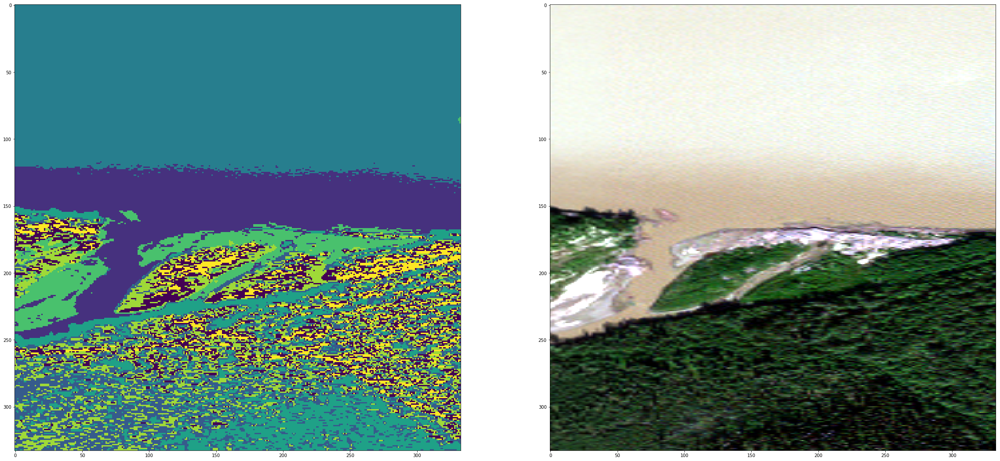

In [11]:
## show the result
fig, ax = plt.subplots(1,2, figsize = (40,40))
pred_data_ms = predictedClass_ms.reshape(im_arr_ms.shape[:2])
ax[0].imshow(pred_data_ms)
ax[1].imshow(bytescale(ge_ms_aoi.rgb()))
plt.show()

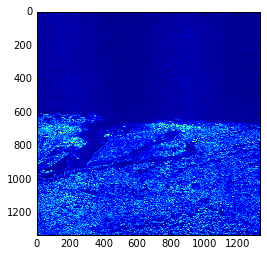

In [12]:
from scipy.ndimage import generic_filter

# add in a sliding window calculation for texture
radius = 2
temp=generic_filter(im_arr[:,:,1], np.std, size=2*radius)
plt.imshow(temp)

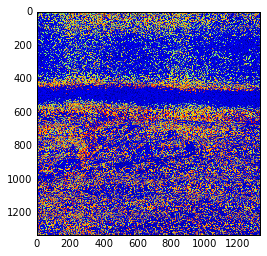

In [13]:
from scipy.ndimage.filters import uniform_filter

def window_stdev(arr, radius):
    c1 = uniform_filter(arr, radius*2, mode='constant', origin=-radius)
    c2 = uniform_filter(arr*arr, radius*2, mode='constant', origin=-radius)
    return ((c2 - c1*c1)**.5)[:-radius*2+1,:-radius*2+1]

temp = window_stdev(im_arr[:,:,1], 1)
plt.imshow(temp)

## look at using segmentation

Felzenszwalb number of segments: 177
SLIC number of segments: 219
Quickshift number of segments: 485


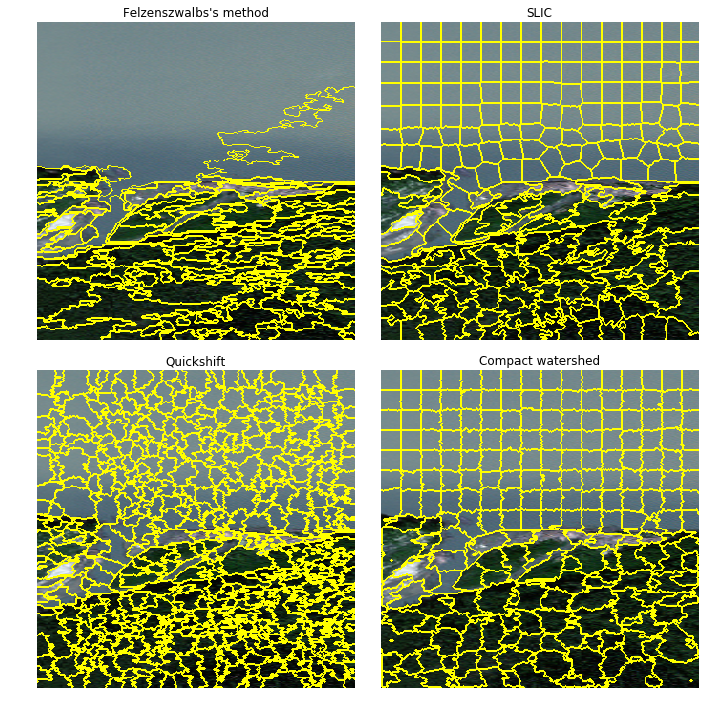

In [15]:
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

# img = img_as_float(astronaut()[::2, ::2])
im_arr_ms = np.rollaxis(ge_ms_aoi, 0, 3).compute()
img = im_arr_ms 
img[:,:,0] /= img[:,:,0].max()
img[:,:,1] /= img[:,:,1].max()
img[:,:,2] /= img[:,:,2].max()
img[:,:,3] /= img[:,:,3].max()

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=.1, sigma=1)
segments_quick = quickshift(img[:,:,:3], kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img[:,:,:3]))
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

print("Felzenszwalb number of segments: {}".format(len(np.unique(segments_fz))))
print('SLIC number of segments: {}'.format(len(np.unique(segments_slic))))
print('Quickshift number of segments: {}'.format(len(np.unique(segments_quick))))

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img[:,:,:3], segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img[:,:,:3], segments_slic))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(mark_boundaries(img[:,:,:3], segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img[:,:,:3], segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

In [18]:
## for one of the segmented images, get some histogram measures for each band
def calc_meas(arr, m_type):
    
    try:
        if m_type == 'mean':
            res = np.mean(arr)

        elif m_type == 'std':
            res = np.std(arr)

        elif m_type == 'range':
            res = np.max(arr) - np.min(arr)

        elif m_type == 'entropy':
            pdf = np.histogram(arr, norm=True)
            pdf = pdf[pdf>0]
            ent = -np.sum(pdf*np.log2(pdf))
            res = ent
            
        else:
            res = 0
    except Exception as e:
        #print(e)
        res = 0
    
    return res


def regionHistMeasures(labeled_im, intensity_im, attrs=['mean']):
    
    num_bands = intensity_im.shape[-1]
    labels = np.unique(labeled_im)
    
    meas_arr = np.zeros((labels.size, len(attrs)*num_bands))
    meas_ls = []
    idx=0
    for meas_type in attrs:
        
        # iterate over the bands
        band_meas = []
        for b in range(num_bands):

            # get the band
            temp_arr = intensity_im[:,:,b]

            # iterate over labels
            seg_meas = []
            for j,lb in enumerate(labels):

                # get the labeled pixels
                temp_arr1 = temp_arr[labeled_im == lb]

                # calculate something
                meas = calc_meas(temp_arr1, meas_type)

                # append to seg list
                seg_meas.append(meas)
                
                
            # seg_meas is a list of the value for the [measurement for each label for the current band]
            # this is inserted into the result array by slicing the correct column
            meas_arr[:, idx] = seg_meas
            idx +=1
            
            # append to band list
            #band_meas.append(seg_meas)
            
            
        # append to attr list
        #meas_ls.append(band_meas)
        
    return meas_arr
        


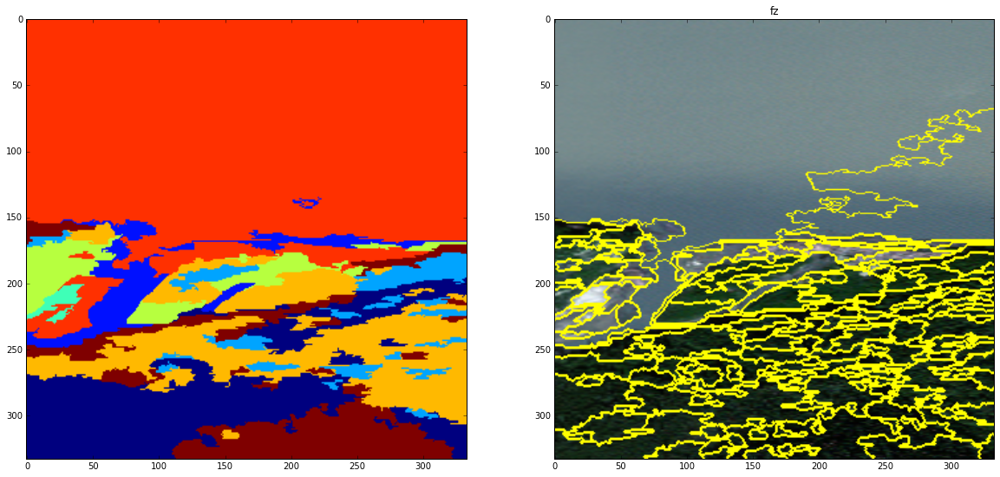

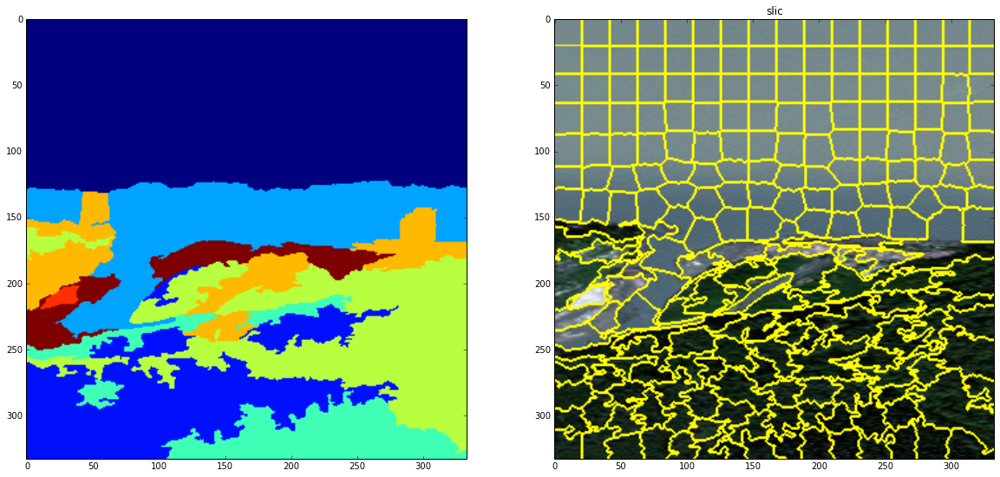

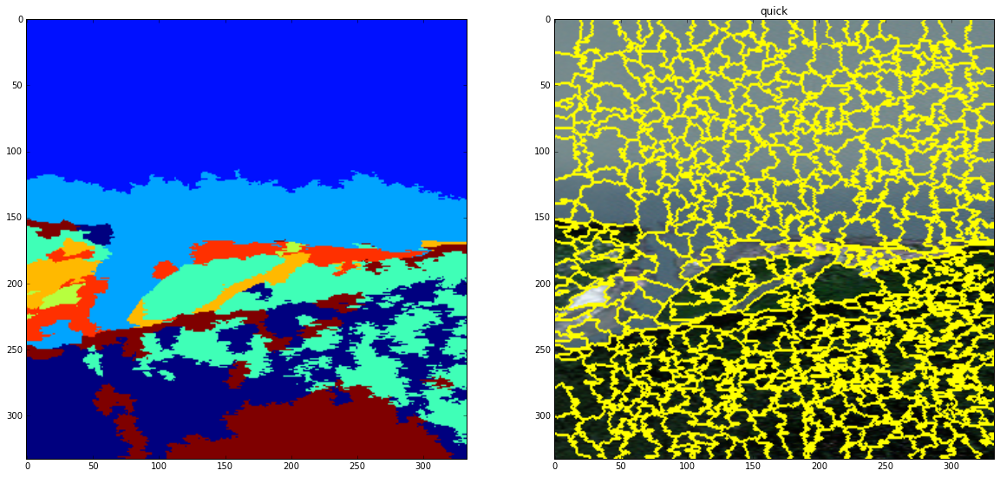

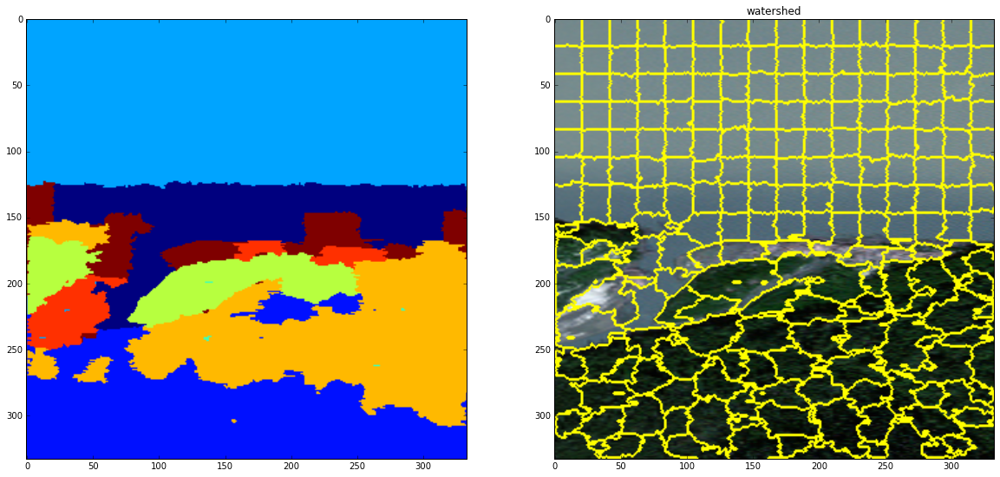

In [147]:
# test the segmentation classification

for seg_im, title in zip([segments_fz, segments_slic, segments_quick, segments_watershed], ['fz', 'slic', 'quick', 'watershed']):
    
    
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range', 'entropy'])
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std'])
#     seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'entropy'])
    #seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range'])
    
    ## now run the classifier on the image segments
    clf_seg = KMeans(n_clusters=nclass, random_state=10)

    # fit it on the segment table
    # fit the KMeans classifier
    predictedClass_seg = clf_seg.fit_predict(seg_attrs, y=None)

    # use the fit model
    # predictedClass = clf_pl.predict(X_pl)
    predictedClass_seg += 1

    ## reassign the segment image to these class labels
    labels = np.unique(seg_im)
    kmeans_seg_im = np.zeros(seg_im.shape)
    for i,lb in enumerate(labels):
        kmeans_seg_im[seg_im==lb] = predictedClass_seg[i]

    
    fig, ax = plt.subplots(1,2, figsize = (20,10))
    ax[0].imshow(kmeans_seg_im)
    ax[1].imshow(mark_boundaries(img[:,:,:3], seg_im))
    ax[1].set_title(title)
    
    plt.show()


## Do the same for the pansharpened data

Felzenszwalb number of segments: 6471
SLIC number of segments: 399
Quickshift number of segments: 6412


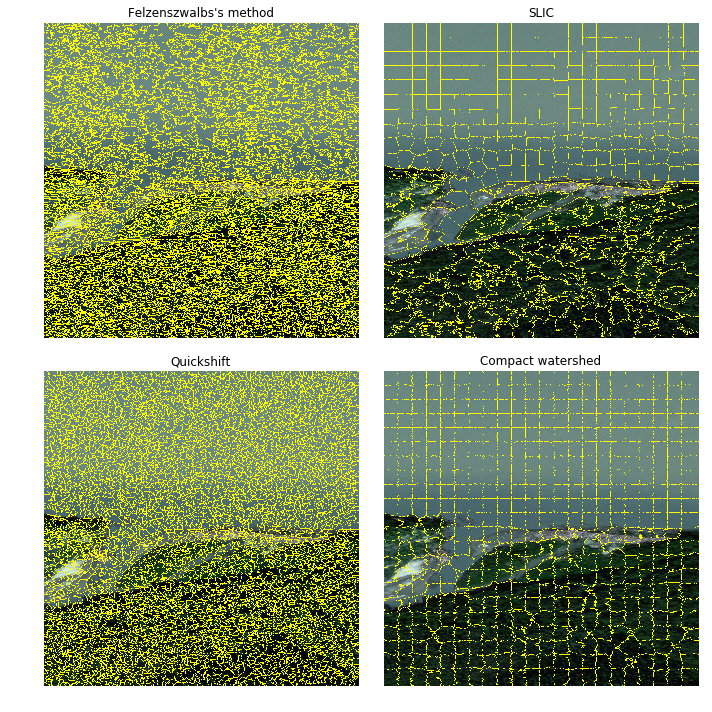

In [22]:
im_arr_ps = np.rollaxis(ge_ps_aoi, 0, 3).compute()
img = im_arr_ps 
img[:,:,0] /= img[:,:,0].max()
img[:,:,1] /= img[:,:,1].max()
img[:,:,2] /= img[:,:,2].max()
img[:,:,3] /= img[:,:,3].max()

segments_fz = felzenszwalb(img, scale=10, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=500, compactness=.1, sigma=1)
segments_quick = quickshift(img[:,:,:3], kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img[:,:,:3]))
segments_watershed = watershed(gradient, markers=500, compactness=.001)

print("Felzenszwalb number of segments: {}".format(len(np.unique(segments_fz))))
print('SLIC number of segments: {}'.format(len(np.unique(segments_slic))))
print('Quickshift number of segments: {}'.format(len(np.unique(segments_quick))))

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img[:,:,:3], segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img[:,:,:3], segments_slic))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(mark_boundaries(img[:,:,:3], segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img[:,:,:3], segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

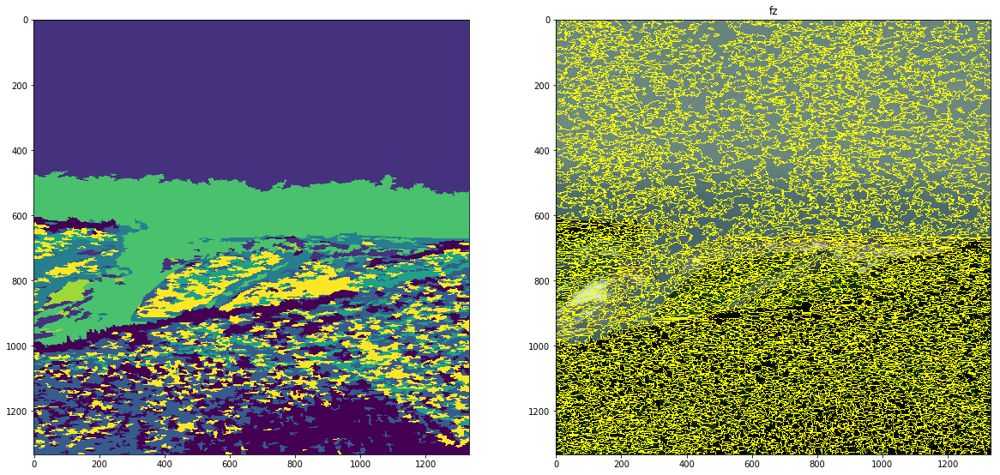

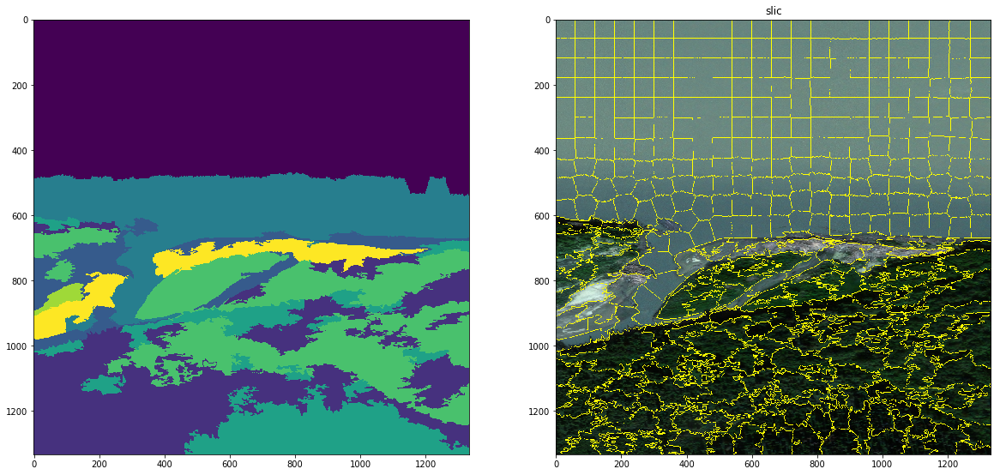

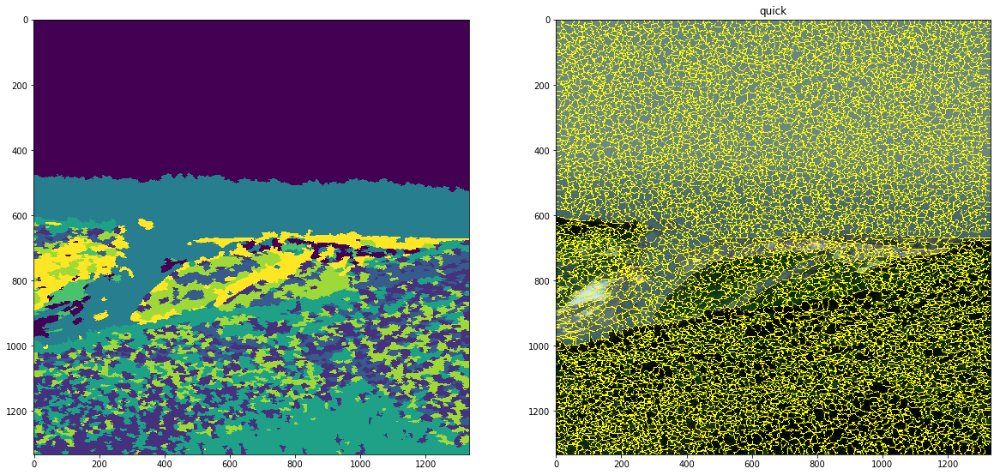

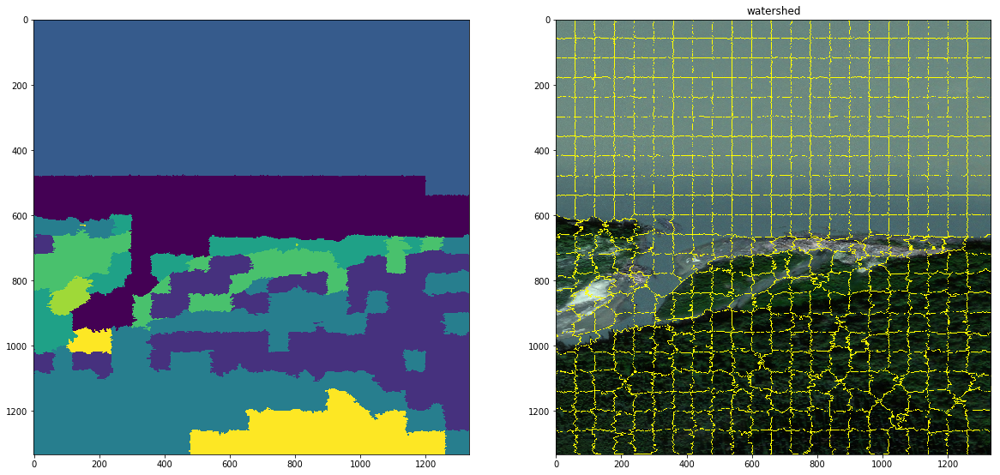

In [23]:
# test the segmentation classification

for seg_im, title in zip([segments_fz, segments_slic, segments_quick, segments_watershed], ['fz', 'slic', 'quick', 'watershed']):
    
    
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range', 'entropy'])
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std'])
#     seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'entropy'])
    #seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range'])
    
    ## now run the classifier on the image segments
    clf_seg = KMeans(n_clusters=nclass, random_state=10)

    # fit it on the segment table
    # fit the KMeans classifier
    predictedClass_seg = clf_seg.fit_predict(seg_attrs, y=None)

    # use the fit model
    # predictedClass = clf_pl.predict(X_pl)
    predictedClass_seg += 1

    ## reassign the segment image to these class labels
    labels = np.unique(seg_im)
    kmeans_seg_im = np.zeros(seg_im.shape)
    for i,lb in enumerate(labels):
        kmeans_seg_im[seg_im==lb] = predictedClass_seg[i]

    
    fig, ax = plt.subplots(1,2, figsize = (20,10))
    ax[0].imshow(kmeans_seg_im)
    ax[1].imshow(mark_boundaries(img[:,:,:3], seg_im))
    ax[1].set_title(title)
    
    plt.show()